In [1]:
# pip install tf_explain

In [2]:
# common
import os
import keras
import numpy as np
import pandas as pd
from glob import glob
import tensorflow as tf
import tensorflow.image as tfi

# Data
from keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.utils import to_categorical

# Data Viz
import matplotlib.pyplot as plt

# Model 
from keras.models import Model
from keras.layers import Layer
from keras.layers import Conv2D
from keras.layers import Dropout
from keras.layers import UpSampling2D
from keras.layers import concatenate
from keras.layers import Add
from keras.layers import Multiply
from keras.layers import Input
from keras.layers import MaxPool2D
from keras.layers import BatchNormalization

# Callbacks 
from keras.callbacks import Callback
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
from tf_explain.core.grad_cam import GradCAM

# Metrics
from keras.metrics import MeanIoU

2024-03-13 04:59:46.971669: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [3]:
def load_image(image, SIZE):
    return np.round(tfi.resize(img_to_array(load_img(image))/255.,(SIZE, SIZE)),4)

def load_images(image_paths, SIZE, mask=False, trim=None):
    if trim is not None:
        image_paths = image_paths[:trim]
    
    if mask:
        images = np.zeros(shape=(len(image_paths), SIZE, SIZE, 1))
    else:
        images = np.zeros(shape=(len(image_paths), SIZE, SIZE, 3))
    
    for i,image in enumerate(image_paths):
        img = load_image(image,SIZE)
        if mask:
            images[i] = img[:,:,:1]
        else:
            images[i] = img
    
    return images

In [4]:
def show_image(image, title=None, cmap=None, alpha=1):
    plt.imshow(image, cmap=cmap, alpha=alpha)
    if title is not None:
        plt.title(title)
    plt.axis('off')

def show_mask(image, mask, cmap=None, alpha=0.4):
    plt.imshow(image)
    plt.imshow(tf.squeeze(mask), cmap=cmap, alpha=alpha)
    plt.axis('off')

In [5]:
SIZE = 256

In [6]:
# import numpy as np 
# import pandas as pd
# import os
# image_paths = []
# for dirname, _, filenames in os.walk('/Users/san5h0llow/Data_Science/Skin_deases/Dataset/'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))
#         image_paths.append(os.path.join(dirname, filename))
        

In [7]:
# import numpy as np 
# import pandas as pd
# import os
# mask_paths = []
# for dirname, _, filenames in os.walk('/Users/san5h0llow/Data_Science/Skin_deases/Dataset5/'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))
#         mask_paths.append(os.path.join(dirname, filename))

In [8]:
root_path = '/Users/san5h0llow/Data_Science/Skin_deases/Dataset7/'
classes = sorted(os.listdir(root_path))
classes

['.DS_Store', 'melanoma', 'notmelanoma']

In [9]:
single_mask_paths = sorted([sorted(glob(root_path + name + "/*mask.png")) for name in classes])
double_mask_paths = sorted([sorted(glob(root_path + name + "/*mask_1.png")) for name in classes])

In [10]:
image_paths = []
mask_paths = []
for class_path in single_mask_paths:
    for path in class_path:
        img_path = path.replace('_mask','')
        image_paths.append(img_path)
        mask_paths.append(path)

In [11]:
image_paths

['/Users/san5h0llow/Data_Science/Skin_deases/Dataset7/melanoma/melanoma10.png',
 '/Users/san5h0llow/Data_Science/Skin_deases/Dataset7/melanoma/melanoma11.png',
 '/Users/san5h0llow/Data_Science/Skin_deases/Dataset7/melanoma/melanoma12.png',
 '/Users/san5h0llow/Data_Science/Skin_deases/Dataset7/melanoma/melanoma13.png',
 '/Users/san5h0llow/Data_Science/Skin_deases/Dataset7/melanoma/melanoma14.png',
 '/Users/san5h0llow/Data_Science/Skin_deases/Dataset7/melanoma/melanoma15.png',
 '/Users/san5h0llow/Data_Science/Skin_deases/Dataset7/melanoma/melanoma16.png',
 '/Users/san5h0llow/Data_Science/Skin_deases/Dataset7/melanoma/melanoma17.png',
 '/Users/san5h0llow/Data_Science/Skin_deases/Dataset7/melanoma/melanoma18.png',
 '/Users/san5h0llow/Data_Science/Skin_deases/Dataset7/melanoma/melanoma19.png',
 '/Users/san5h0llow/Data_Science/Skin_deases/Dataset7/melanoma/melanoma1.png',
 '/Users/san5h0llow/Data_Science/Skin_deases/Dataset7/melanoma/melanoma20.png',
 '/Users/san5h0llow/Data_Science/Skin_dea

In [12]:
mask_paths

['/Users/san5h0llow/Data_Science/Skin_deases/Dataset7/melanoma/melanoma10_mask.png',
 '/Users/san5h0llow/Data_Science/Skin_deases/Dataset7/melanoma/melanoma11_mask.png',
 '/Users/san5h0llow/Data_Science/Skin_deases/Dataset7/melanoma/melanoma12_mask.png',
 '/Users/san5h0llow/Data_Science/Skin_deases/Dataset7/melanoma/melanoma13_mask.png',
 '/Users/san5h0llow/Data_Science/Skin_deases/Dataset7/melanoma/melanoma14_mask.png',
 '/Users/san5h0llow/Data_Science/Skin_deases/Dataset7/melanoma/melanoma15_mask.png',
 '/Users/san5h0llow/Data_Science/Skin_deases/Dataset7/melanoma/melanoma16_mask.png',
 '/Users/san5h0llow/Data_Science/Skin_deases/Dataset7/melanoma/melanoma17_mask.png',
 '/Users/san5h0llow/Data_Science/Skin_deases/Dataset7/melanoma/melanoma18_mask.png',
 '/Users/san5h0llow/Data_Science/Skin_deases/Dataset7/melanoma/melanoma19_mask.png',
 '/Users/san5h0llow/Data_Science/Skin_deases/Dataset7/melanoma/melanoma1_mask.png',
 '/Users/san5h0llow/Data_Science/Skin_deases/Dataset7/melanoma/mel

In [13]:
print(len(image_paths))

180


In [14]:
print(len(mask_paths))

180


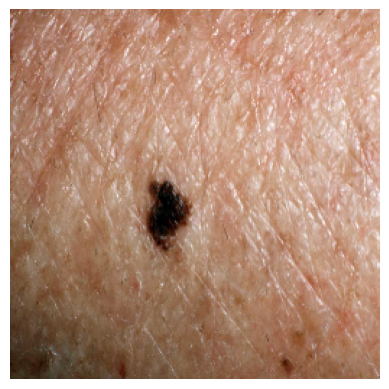

In [15]:
show_image(load_image(image_paths[0], SIZE))

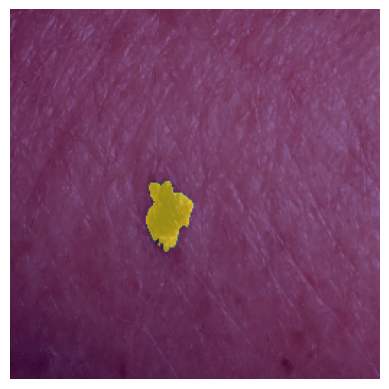

In [16]:
show_mask(load_image(image_paths[0], SIZE), load_image(mask_paths[0], SIZE)[:,:,0], alpha=0.6)

In [17]:
images = load_images(image_paths, SIZE)
masks = load_images(mask_paths, SIZE, mask=True)

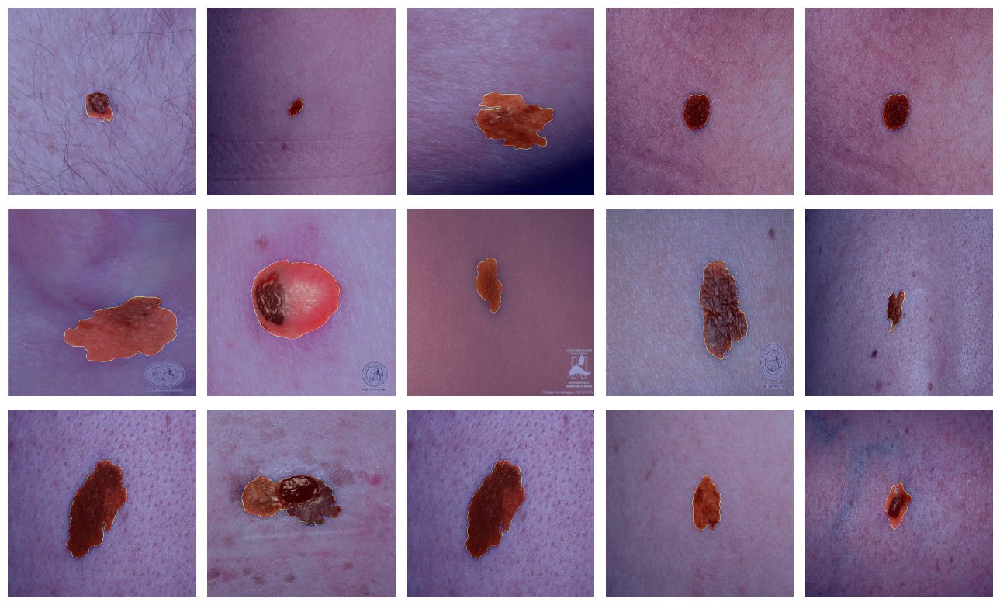

In [18]:
plt.figure(figsize=(13,8))
for i in range(15):
    plt.subplot(3,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='jet')
plt.tight_layout()
plt.show()

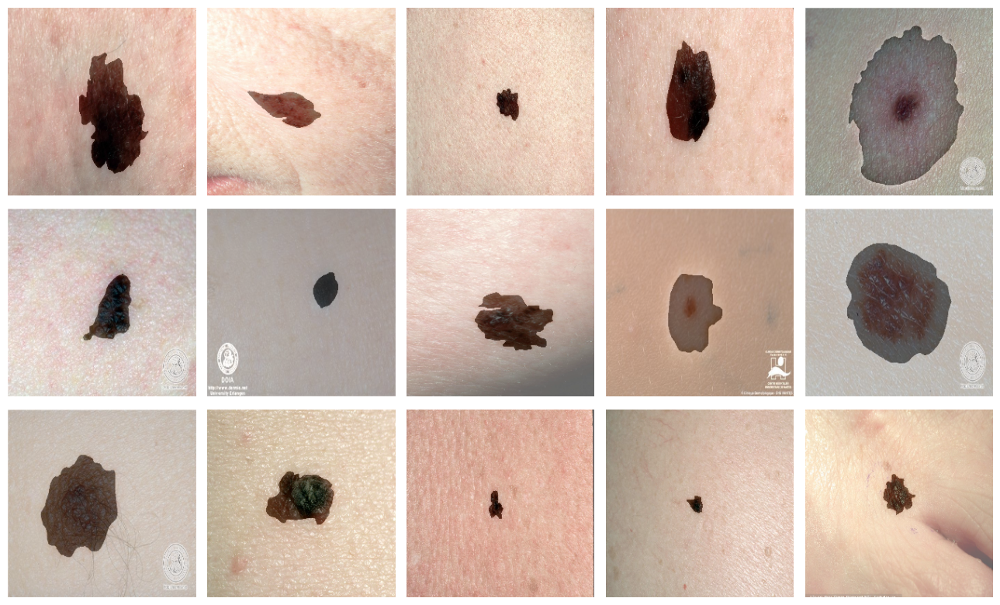

In [19]:
plt.figure(figsize=(13,8))
for i in range(15):
    plt.subplot(3,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='binary')
plt.tight_layout()
plt.show()

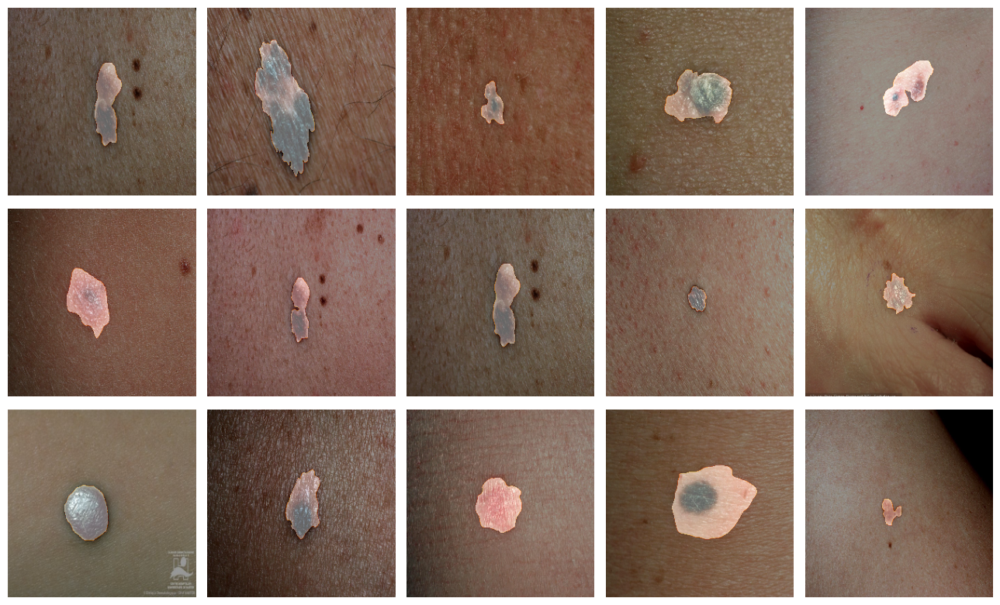

In [20]:
plt.figure(figsize=(13,8))
for i in range(15):
    plt.subplot(3,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='afmhot')
plt.tight_layout()
plt.show()

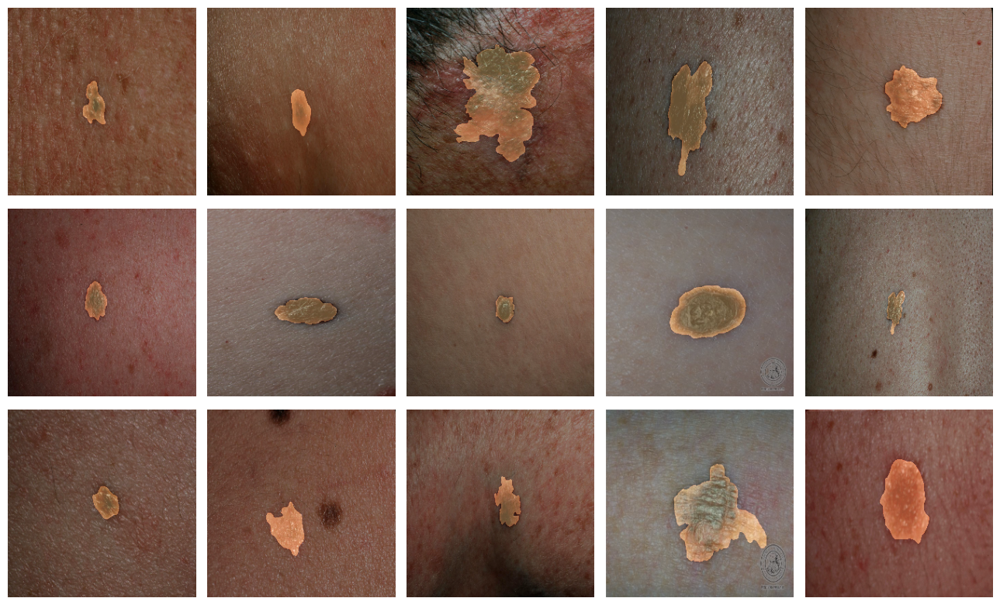

In [21]:
plt.figure(figsize=(13,8))
for i in range(15):
    plt.subplot(3,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='copper')
plt.tight_layout()
plt.show()


In [22]:
class EncoderBlock(Layer):

    def __init__(self, filters, rate, pooling=True, **kwargs):
        super(EncoderBlock, self).__init__(**kwargs)

        self.filters = filters
        self.rate = rate
        self.pooling = pooling

        self.c1 = Conv2D(filters, kernel_size=3, strides=1, padding='same', activation='relu', kernel_initializer='he_normal')
        self.drop = Dropout(rate)
        self.c2 = Conv2D(filters, kernel_size=3, strides=1, padding='same', activation='relu', kernel_initializer='he_normal')
        self.pool = MaxPool2D()

    def call(self, X):
        x = self.c1(X)
        x = self.drop(x)
        x = self.c2(x)
        if self.pooling:
            y = self.pool(x)
            return y, x
        else:
            return x

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            'rate':self.rate,
            'pooling':self.pooling
        }

In [23]:
class DecoderBlock(Layer):

    def __init__(self, filters, rate, **kwargs):
        super(DecoderBlock, self).__init__(**kwargs)

        self.filters = filters
        self.rate = rate

        self.up = UpSampling2D()
        self.net = EncoderBlock(filters, rate, pooling=False)

    def call(self, X):
        X, skip_X = X
        x = self.up(X)
        c_ = concatenate([x, skip_X])
        x = self.net(c_)
        return x

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            'rate':self.rate,
        }

In [24]:
class AttentionGate(Layer):

    def __init__(self, filters, bn, **kwargs):
        super(AttentionGate, self).__init__(**kwargs)

        self.filters = filters
        self.bn = bn

        self.normal = Conv2D(filters, kernel_size=3, padding='same', activation='relu', kernel_initializer='he_normal')
        self.down = Conv2D(filters, kernel_size=3, strides=2, padding='same', activation='relu', kernel_initializer='he_normal')
        self.learn = Conv2D(1, kernel_size=1, padding='same', activation='sigmoid')
        self.resample = UpSampling2D()
        self.BN = BatchNormalization()

    def call(self, X):
        X, skip_X = X

        x = self.normal(X)
        skip = self.down(skip_X)
        x = Add()([x, skip])
        x = self.learn(x)
        x = self.resample(x)
        f = Multiply()([x, skip_X])
        if self.bn:
            return self.BN(f)
        else:
            return f
        # return f

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            "bn":self.bn
        }

In [25]:
class ShowProgress(Callback):
    def on_epoch_end(self, epochs, logs=None):
        id = np.random.randint(200)
        exp = GradCAM()
        image = images[id]
        mask = masks[id]
        pred_mask = self.model.predict(image[np.newaxis,...])
        cam = exp.explain(
            validation_data=(image[np.newaxis,...], mask),
            class_index=1,
            layer_name='Attention4',
            model=self.model
        )

        plt.figure(figsize=(10,5))

        plt.subplot(1,3,1)
        plt.title("Original Mask")
        show_mask(image, mask, cmap='copper')

        plt.subplot(1,3,2)
        plt.title("Predicted Mask")
        show_mask(image, pred_mask, cmap='copper')

        plt.subplot(1,3,3)
        show_image(cam,title="GradCAM")

        plt.tight_layout()
        plt.show()

In [26]:
# Inputs
input_layer = Input(shape=images.shape[-3:])

# Encoder
p1, c1 = EncoderBlock(32,0.1, name="Encoder1")(input_layer)
p2, c2 = EncoderBlock(64,0.1, name="Encoder2")(p1)
p3, c3 = EncoderBlock(128,0.2, name="Encoder3")(p2)
p4, c4 = EncoderBlock(256,0.2, name="Encoder4")(p3)

# Encoding
encoding = EncoderBlock(512,0.3, pooling=False, name="Encoding")(p4)

# Attention + Decoder

a1 = AttentionGate(256, bn=True, name="Attention1")([encoding, c4])
d1 = DecoderBlock(256,0.2, name="Decoder1")([encoding, a1])

a2 = AttentionGate(128, bn=True, name="Attention2")([d1, c3])
d2 = DecoderBlock(128,0.2, name="Decoder2")([d1, a2])

a3 = AttentionGate(64, bn=True, name="Attention3")([d2, c2])
d3 = DecoderBlock(64,0.1, name="Decoder3")([d2, a3])


a4 = AttentionGate(32, bn=True, name="Attention4")([d3, c1])
d4 = DecoderBlock(32,0.1, name="Decoder4")([d3, a4])

# Output 
output_layer = Conv2D(1, kernel_size=1, activation='sigmoid', padding='same')(d4)

# Model
model = Model(
    inputs=[input_layer],
    outputs=[output_layer]
)
model.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 Encoder1 (EncoderBlock)     ((None, 128, 128, 32),       10144     ['input_1[0][0]']             
                              (None, 256, 256, 32))                                               
                                                                                                  
 Encoder2 (EncoderBlock)     ((None, 64, 64, 64),         55424     ['Encoder1[0][0]']            
                              (None, 128, 128, 64))                                               
                                                                                              

In [27]:
# Compile
model.compile(
    loss='binary_crossentropy',
    optimizer='adam',
    metrics=['accuracy', MeanIoU(num_classes=2, name='IoU')]
)

# Callbacks
cb = [
    # EarlyStopping(patience=3, restore_best_weight=True), # With Segmentation I trust on eyes rather than on metrics
    ModelCheckpoint("AttentionCustomUNet.h5", save_best_only=True),
    ShowProgress()
]

In [28]:
# Config Training
BATCH_SIZE = 8
SPE = len(images)//BATCH_SIZE

# Training
results = model.fit(
    images, masks,
    epochs=10, # 15 will be enough for a good Model for better model go with 20+
)

Epoch 1/10
6/6 [==============================] - 540s 80s/step - loss: 2.2337 - accuracy: 0.6471 - IoU: 0.4575
Epoch 2/10
6/6 [==============================] - 412s 68s/step - loss: 0.4724 - accuracy: 0.8398 - IoU: 0.4575
Epoch 3/10
6/6 [==============================] - 410s 67s/step - loss: 0.2514 - accuracy: 0.9133 - IoU: 0.4575
Epoch 4/10
6/6 [==============================] - 404s 65s/step - loss: 0.1827 - accuracy: 0.9234 - IoU: 0.4575
Epoch 5/10
6/6 [==============================] - 425s 71s/step - loss: 0.1744 - accuracy: 0.9437 - IoU: 0.4575
Epoch 6/10
6/6 [==============================] - 393s 65s/step - loss: 0.1666 - accuracy: 0.9462 - IoU: 0.4575
Epoch 7/10
6/6 [==============================] - 411s 68s/step - loss: 0.1690 - accuracy: 0.9501 - IoU: 0.4575
Epoch 8/10
6/6 [==============================] - 430s 70s/step - loss: 0.1574 - accuracy: 0.9526 - IoU: 0.4575
Epoch 9/10
6/6 [==============================] - 412s 68s/step - loss: 0.1390 - accuracy: 0.9561 - IoU:

In [30]:
print(results.history.keys())

dict_keys(['loss', 'accuracy', 'IoU'])


In [33]:
print(results.history['loss'])
print(results.history['accuracy'])
print(results.history['IoU'])

[2.2336742877960205, 0.4723932147026062, 0.25138741731643677, 0.1826505810022354, 0.17437471449375153, 0.16664625704288483, 0.16904711723327637, 0.15738588571548462, 0.13896343111991882, 0.13357137143611908]
[0.6471109390258789, 0.8397616744041443, 0.9133107662200928, 0.9233518838882446, 0.9437023401260376, 0.9461690187454224, 0.9500555396080017, 0.952581524848938, 0.9561172723770142, 0.9613209366798401]
[0.4574875831604004, 0.4574875831604004, 0.4574875831604004, 0.4574875831604004, 0.4574875831604004, 0.4574875831604004, 0.4574875831604004, 0.4574875831604004, 0.4574875831604004, 0.4574875831604004]


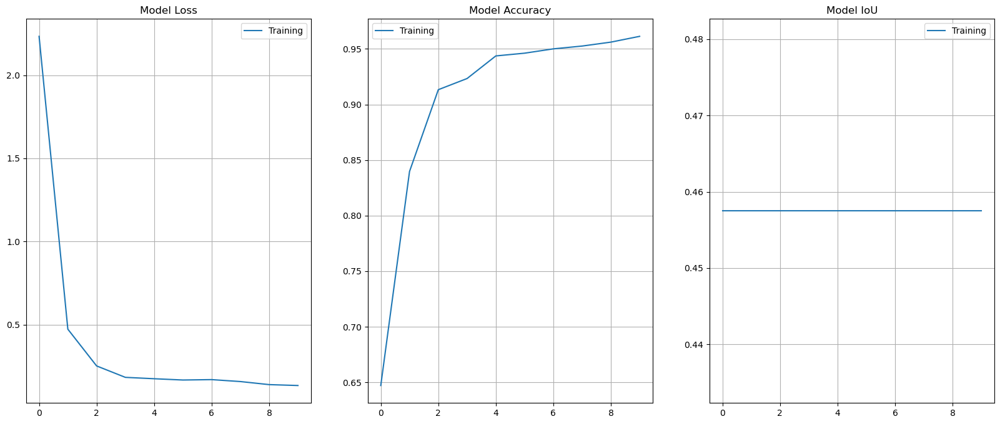

In [35]:
plt.figure(figsize=(20,8))

plt.subplot(1,3,1)
plt.title("Model Loss")
plt.plot(results.history['loss'], label="Training")
# plt.plot(val_loss, label="Validtion")
plt.legend()
plt.grid()

plt.subplot(1,3,2)
plt.title("Model Accuracy")
plt.plot(results.history['accuracy'], label="Training")
# plt.plot(val_accuracy, label="Validtion")
plt.legend()
plt.grid()

plt.subplot(1,3,3)
plt.title("Model IoU")
plt.plot(results.history['IoU'], label="Training")
# plt.plot(val_iou, label="Validtion")
plt.legend()
plt.grid()

plt.show()

1/1 [==============================] - 0s 411ms/step


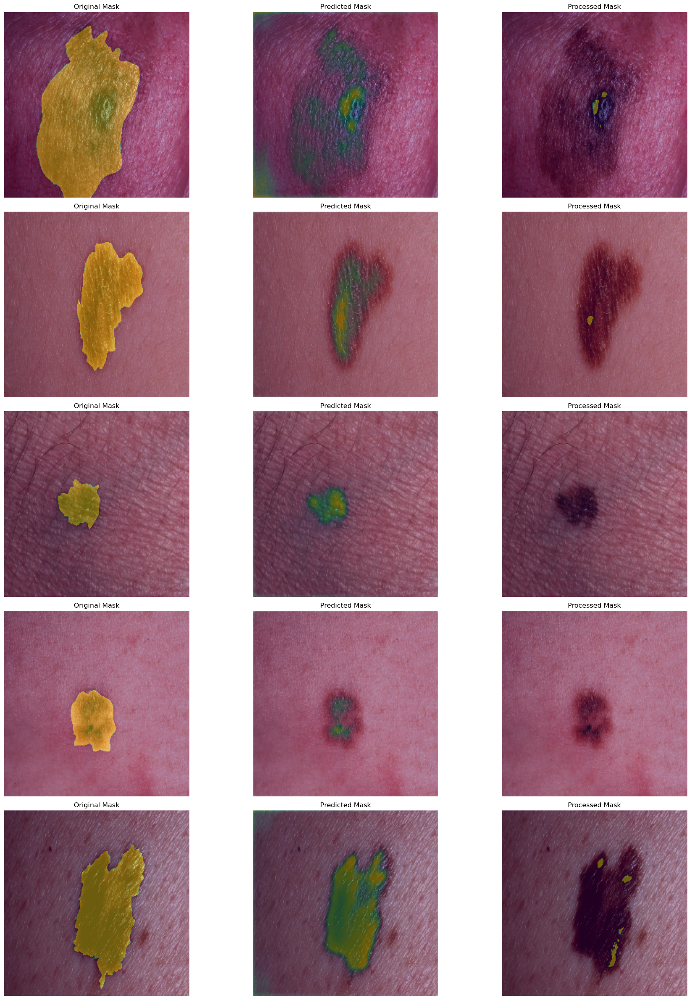

In [36]:
plt.figure(figsize=(20,25))
n=0
for i in range(1,(5*3)+1):
    plt.subplot(5,3,i)
    if n==0:
        id = np.random.randint(len(images))
        image = images[id]
        mask = masks[id]
        pred_mask = model.predict(image[np.newaxis,...])

        plt.title("Original Mask")
        show_mask(image, mask)
        n+=1
    elif n==1:
        plt.title("Predicted Mask")
        show_mask(image, pred_mask)
        n+=1
    elif n==2:
        pred_mask = (pred_mask>0.5).astype('float')
        plt.title("Processed Mask")
        show_mask(image, pred_mask)
        n=0
plt.tight_layout()
plt.show()